In [2]:
import scanpy as sc
import pandas as pd


In [3]:
region = 'cerebral_cortex'
rev_n = 12

In [4]:
adata = sc.read(f'/home/ratopin/big_data/nmr/{region}_nmr_adata_multiple_ann{rev_n}.h5ad')

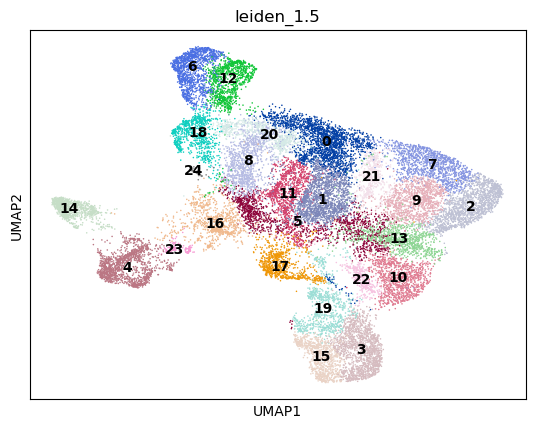

In [79]:
sc.pl.umap(adata, color='leiden_1.5', legend_loc='on data', save='_leiden_clusters.png')

In [7]:
import celltypist
from celltypist import models

In [8]:
models.models_description().model[models.models_description().model.str.contains('cortex', case=False)]

👉 Detailed model information can be found at `https://www.celltypist.org/models`
👉 Detailed model information can be found at `https://www.celltypist.org/models`


6     Adult_Human_PrefrontalCortex.pkl
52     Mouse_Isocortex_Hippocampus.pkl
Name: model, dtype: object

In [9]:
moldel_list = ['Developing_Human_Brain','Developing_Mouse_Brain','Mouse_Whole_Brain'
               'Adult_CynomolgusMacaque_Hippocampus', 'Adult_Pig_Hippocampus',
              'Adult_RhesusMacaque_Hippocampus','Developing_Human_Hippocampus',
              'Developing_Mouse_Hippocampus','Human_AdultAged_Hippocampus',
              'Human_Longitudinal_Hippocampus','Mouse_Isocortex_Hippocampus',
              'Adult_Human_PrefrontalCortex']


In [10]:
predictions = celltypist.annotate(adata, model = f'{moldel_list[0]}.pkl', majority_voting = True, over_clustering='leiden_4.0', min_prop=0.2)


👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 24378 cells and 17413 genes
🔗 Matching reference genes in the model


🧬 805 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


In [11]:
def split_predictions_by_region(
    df,
    df_col="predicted_labels",
    regex_pattern=None,
    key_added1="Region",
    key_added2="CellType",
):
    if regex_pattern is None:
        regex_pattern = (
            r'^(?P<Region_mb>\w+\s+midbrain)\s+(?P<CellType_mb>.+)$'
            r'|^(?P<Region_simple>\w+)\s+(?P<CellType_simple>.+)$'
        )

    out = df[df_col].astype(str).str.extract(regex_pattern)

    df[key_added1] = out["Region_mb"].fillna(out["Region_simple"])
    df[key_added2] = out["CellType_mb"].fillna(out["CellType_simple"])


In [12]:
split_predictions_by_region(predictions.predicted_labels, 'predicted_labels')
split_predictions_by_region(predictions.predicted_labels, 'majority_voting', key_added1="Region_mv", key_added2="CellType_mv",)

... storing 'celltypist_Developing_Human_Brain' as categorical
... storing 'celltypist_Developing_Human_Brain_mv' as categorical


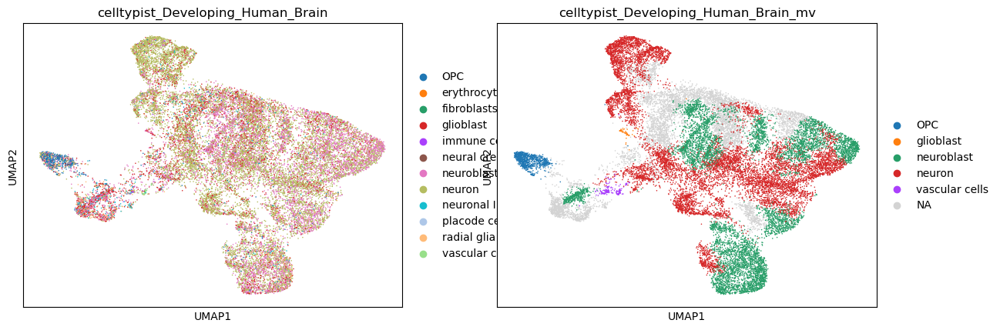

In [13]:
adata.obs[f'celltypist_{moldel_list[0]}']= adata.obs_names.map(predictions.predicted_labels.CellType)
adata.obs[f'celltypist_{moldel_list[0]}_mv']= adata.obs_names.map(predictions.predicted_labels.CellType_mv)
sc.pl.umap(adata, color=[f'celltypist_{moldel_list[0]}', f'celltypist_{moldel_list[0]}_mv'])


In [14]:
# celltypist.dotplot(predictions, use_as_reference = 'column_key_of_manual_annotation', use_as_prediction = 'predicted_labels')

In [15]:
moldel_list.pop(0)

'Developing_Human_Brain'

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 24378 cells and 17413 genes


🔗 Matching reference genes in the model


0 Developing_Mouse_Brain


🧬 27 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


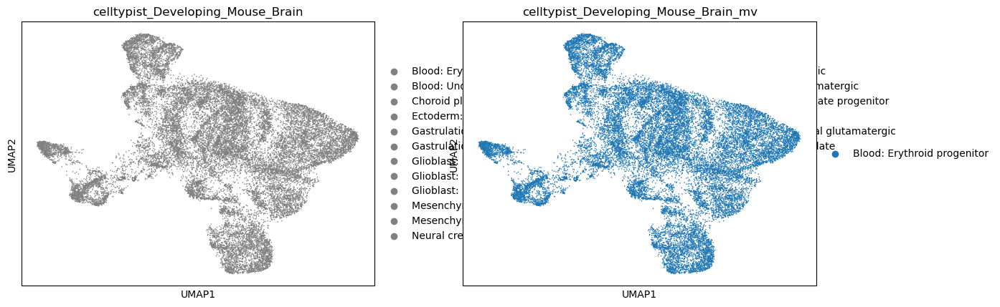

📂 Storing models in /home/ratopin/.celltypist/data/models
👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 24378 cells and 17413 genes
🔗 Matching reference genes in the model


1 Mouse_Whole_BrainAdult_CynomolgusMacaque_Hippocampus
Model not found. Trying to download it...
Model Mouse_Whole_BrainAdult_CynomolgusMacaque_Hippocampus not available to download. Skipping
2 Adult_Pig_Hippocampus


🧬 1806 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


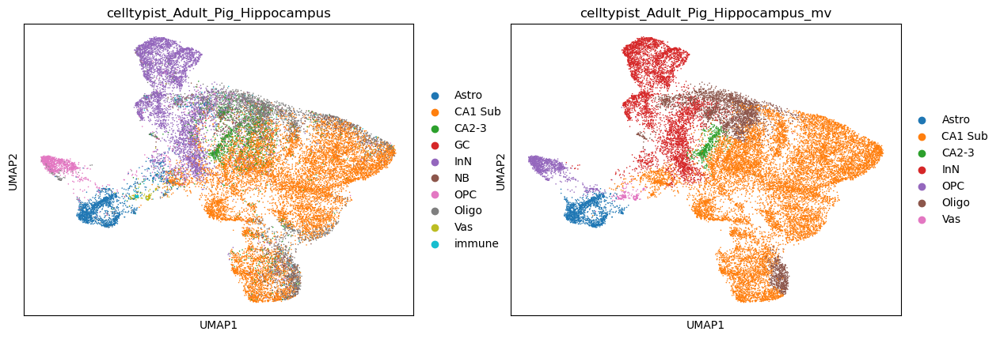

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 24378 cells and 17413 genes
🔗 Matching reference genes in the model
🧬 1747 features used for prediction


3 Adult_RhesusMacaque_Hippocampus


⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


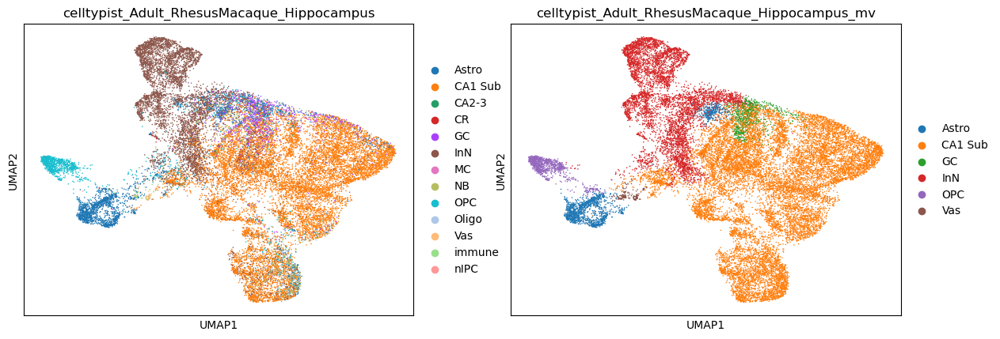

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 24378 cells and 17413 genes
🔗 Matching reference genes in the model


4 Developing_Human_Hippocampus


🧬 1994 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


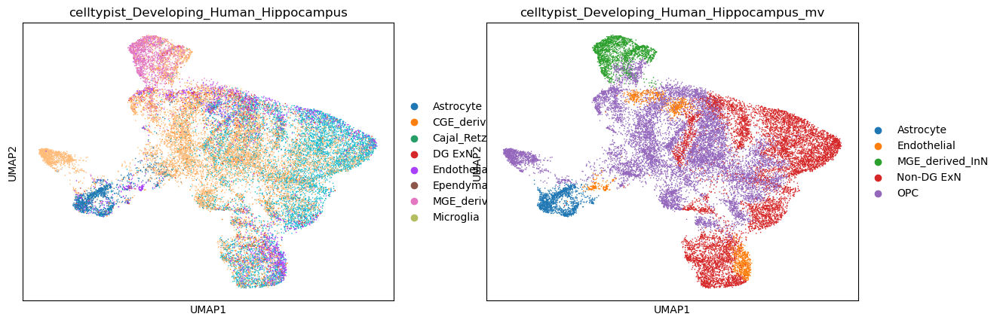

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 24378 cells and 17413 genes
🔗 Matching reference genes in the model


5 Developing_Mouse_Hippocampus


🧬 12 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


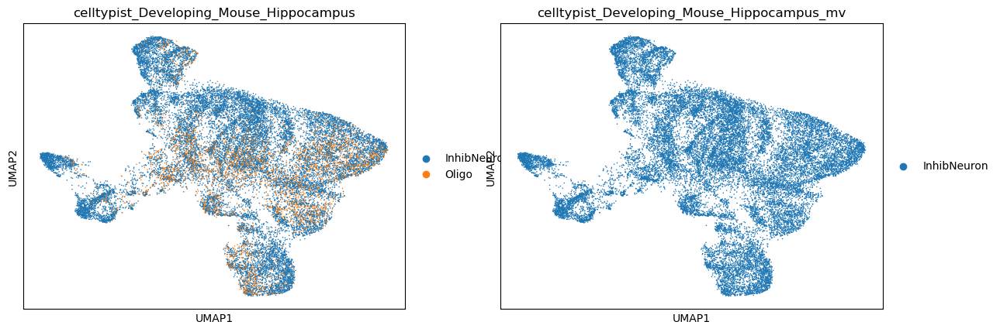

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 24378 cells and 17413 genes
🔗 Matching reference genes in the model


6 Human_AdultAged_Hippocampus


🧬 1834 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


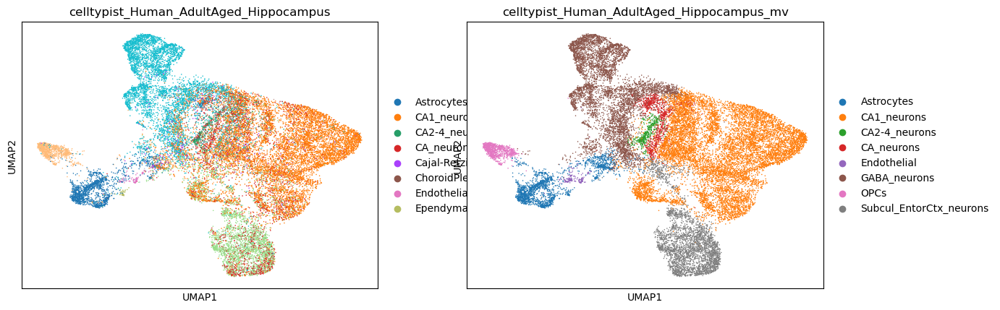

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 24378 cells and 17413 genes
🔗 Matching reference genes in the model


7 Human_Longitudinal_Hippocampus


🧬 2274 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


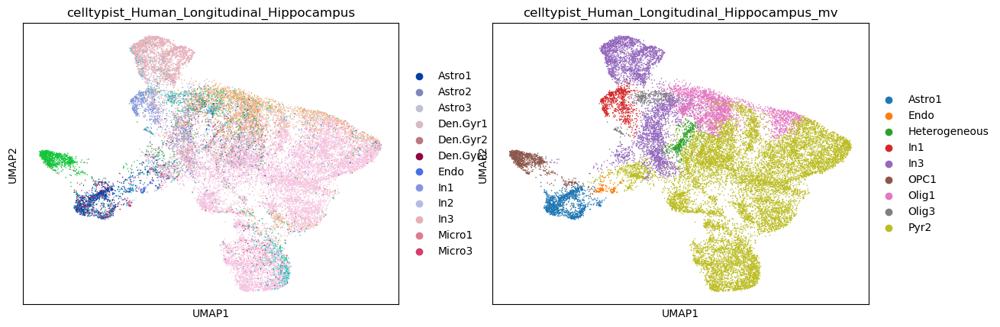

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 24378 cells and 17413 genes
🔗 Matching reference genes in the model


8 Mouse_Isocortex_Hippocampus


🧬 8 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


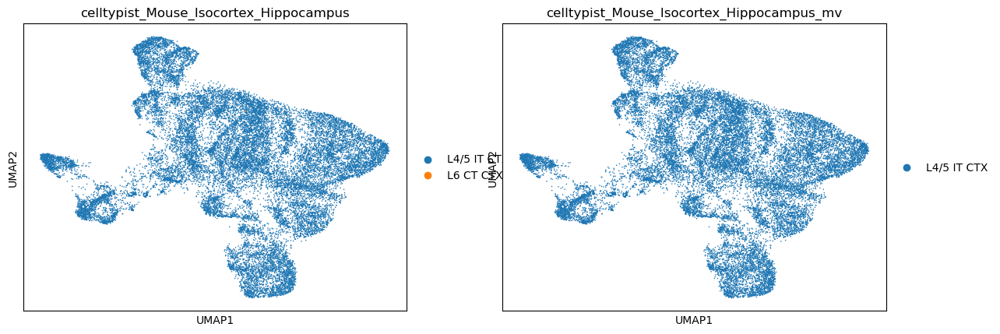

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 24378 cells and 17413 genes
🔗 Matching reference genes in the model


9 Adult_Human_PrefrontalCortex


🧬 3095 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


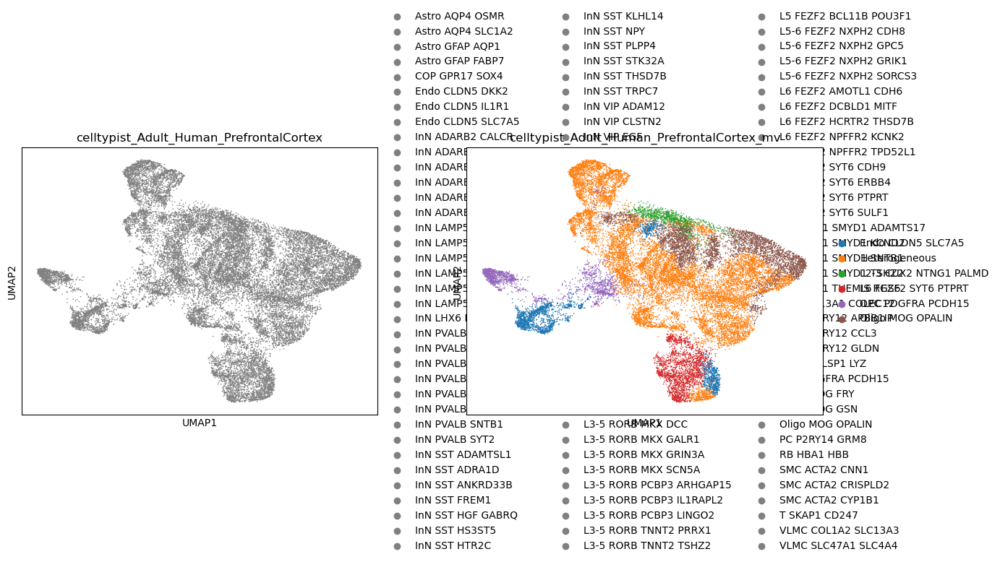

... storing 'celltypist_Adult_Human_PrefrontalCortex' as categorical
... storing 'celltypist_Adult_Human_PrefrontalCortex_mv' as categorical


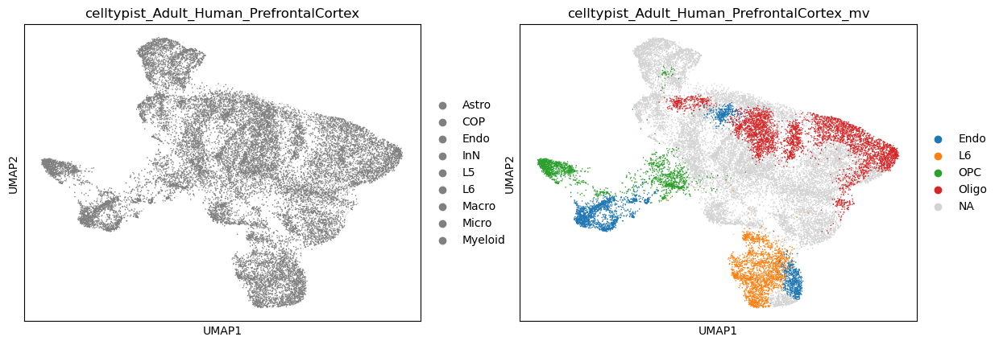

In [35]:
for i, model_name in enumerate(moldel_list):
    print(i,model_name)
    try:
        predictions = celltypist.annotate(adata, model = f'{model_name}.pkl', majority_voting = True, over_clustering='leiden_4.0', min_prop=0.2)
    except: 
        print(f'Model not found. Trying to download it...')
        try: models.download_models(model = f'{model_name}.pkl')
        except: 
            print(f"Model {model_name} not available to download. Skipping")
            continue
        predictions = celltypist.annotate(adata, model = f'{model_name}.pkl', majority_voting = True, over_clustering='leiden_4.0', min_prop=0.2)
    adata.obs[f'celltypist_{model_name}']= adata.obs_names.map(predictions.predicted_labels.predicted_labels)
    adata.obs[f'celltypist_{model_name}_mv']= adata.obs_names.map(predictions.predicted_labels.majority_voting)
    sc.pl.umap(adata, color=[f'celltypist_{model_name}', f'celltypist_{model_name}_mv'])


split_predictions_by_region(predictions.predicted_labels, 'predicted_labels',key_added1="Celltype", key_added2="Markers")
split_predictions_by_region(predictions.predicted_labels, 'majority_voting', key_added1="Celltype_mv", key_added2="Markers_mv",)
adata.obs[f'celltypist_{model_name}']= adata.obs_names.map(predictions.predicted_labels.Celltype)
adata.obs[f'celltypist_{model_name}_mv']= adata.obs_names.map(predictions.predicted_labels.Celltype_mv)
sc.pl.umap(adata, color=[f'celltypist_{model_name}', f'celltypist_{model_name}_mv'])

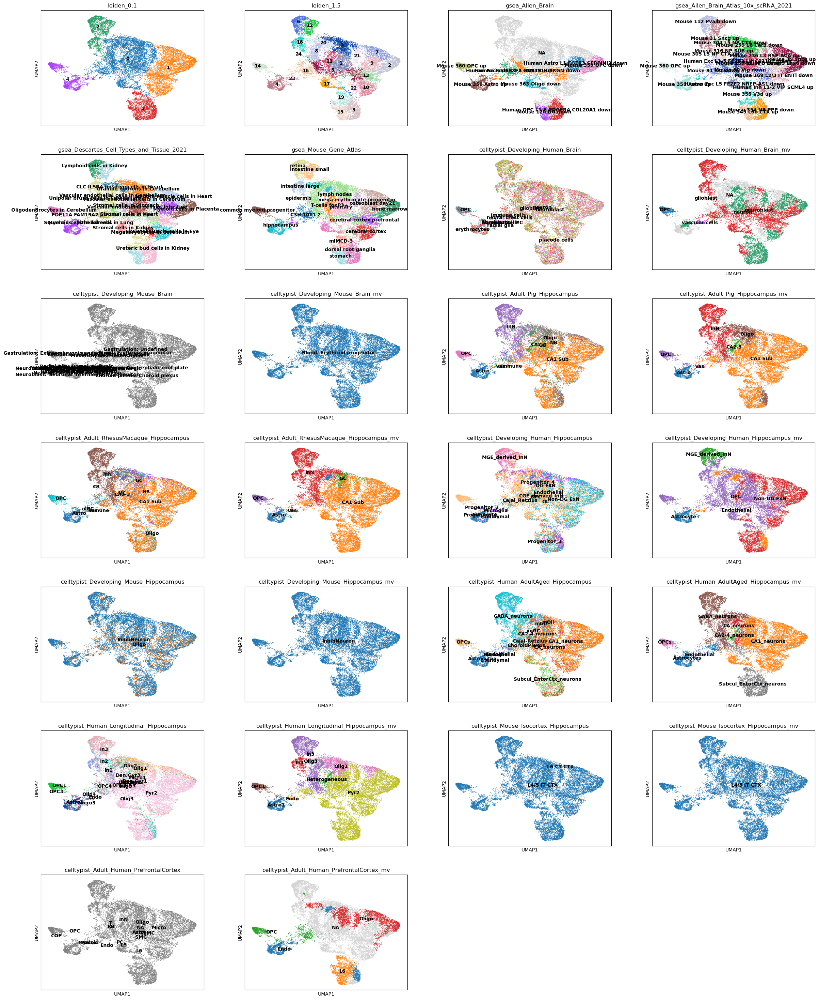

In [27]:
sc.pl.umap(adata, legend_loc='on data',color= ['leiden_0.1', 'leiden_1.5',
 'gsea_Allen_Brain',
 'gsea_Allen_Brain_Atlas_10x_scRNA_2021',
 'gsea_Descartes_Cell_Types_and_Tissue_2021',
 'gsea_Mouse_Gene_Atlas',
 'celltypist_Developing_Human_Brain',
 'celltypist_Developing_Human_Brain_mv',
 'celltypist_Developing_Mouse_Brain',
 'celltypist_Developing_Mouse_Brain_mv',
 'celltypist_Adult_Pig_Hippocampus',
 'celltypist_Adult_Pig_Hippocampus_mv',
 'celltypist_Adult_RhesusMacaque_Hippocampus',
 'celltypist_Adult_RhesusMacaque_Hippocampus_mv',
 'celltypist_Developing_Human_Hippocampus',
 'celltypist_Developing_Human_Hippocampus_mv',
 'celltypist_Developing_Mouse_Hippocampus',
 'celltypist_Developing_Mouse_Hippocampus_mv',
 'celltypist_Human_AdultAged_Hippocampus',
 'celltypist_Human_AdultAged_Hippocampus_mv',
 'celltypist_Human_Longitudinal_Hippocampus',
 'celltypist_Human_Longitudinal_Hippocampus_mv',
 'celltypist_Mouse_Isocortex_Hippocampus',
 'celltypist_Mouse_Isocortex_Hippocampus_mv',
 'celltypist_Adult_Human_PrefrontalCortex',
 'celltypist_Adult_Human_PrefrontalCortex_mv'])

In [ ]:
human_voted_annotation = {
    "0": "Inmature Neuron",
    "1": "CA1 Neuron",
    "2": "",
    "3": "",
    "4":"",

}

In [16]:
clusters_alfred = pd.read_csv('./anotacion_alfred/Asignacion_Celulas_Cluster.csv', index_col=0)
clusters_alfred.head()

,Cluster
Barcode,
AAACCCAAGAAGCGAA-1-NMR1,1
AAACCCAAGGAGGCAG-1-NMR1,6
AAACCCACAAATCAAG-1-NMR1,7
AAACCCACAGTCTACA-1-NMR1,1
AAACCCAGTACGTAGG-1-NMR1,11


In [17]:
clusters_alfred.Cluster.astype("category")

Barcode
AAACCCAAGAAGCGAA-1-NMR1     1
AAACCCAAGGAGGCAG-1-NMR1     6
AAACCCACAAATCAAG-1-NMR1     7
AAACCCACAGTCTACA-1-NMR1     1
AAACCCAGTACGTAGG-1-NMR1    11
                           ..
TTTGTTGCACTGAATC-1-NMR2     0
TTTGTTGGTCCCTCAT-1-NMR2    16
TTTGTTGGTTCGGCTG-1-NMR2     4
TTTGTTGGTTCTCGCT-1-NMR2     3
TTTGTTGTCCGCTTAC-1-NMR2     3
Name: Cluster, Length: 24378, dtype: category
Categories (23, int64): [0, 1, 2, 3, ..., 19, 20, 21, 22]

In [18]:
ann_alfred = pd.read_excel('./anotacion_alfred/etiquetado de clusters.xlsx', index_col=0)
ann_alfred.head()

,genes,Iter1,Iter2,Iter3,Concenso,razonamiento,alternativas
cluster,,,,,,,
0,"KCNIP4, CELF2",Excitatory glutamatergic projection neurons (i...,Cortical glutamatergic projection neurons (int...,Excitatory glutamatergic projection neurons (i...,Neuronas glutamatérgicas de proyección,"After processing this gene list, I believe the...","If it is not this precise population, it could..."
1,"CNTN3, SATB2, PVRL3, ZNF385B, KCNH7, NWD2, DGK...",Intratelencephalic (IT) excitatory cortical py...,Intratelencephalic (IT) SATB2⁺ excitatory cort...,Intratelencephalic-type glutamatergic projecti...,Neuronas priramiladles corticales intretelence...,"After processing this gene list, I believe the...","If it is not this precise population, it could..."
10,"GALNTL6, ERBB4, RBMS3, LHFPL3, GRIP1, SGCZ, CN...",Cortical/Hippocampal Glutamatergic Projection ...,Cortical intratelencephalic (IT) glutamatergic...,Cortical glutamatergic projection neurons (exc...,Neuronas glutamatérgicas de proyección,"After processing this gene list, I believe the...","If it is not this precise population, it could..."
11,"MEF2C, PTPRD, SATB2, CACNA2D1, TAFA1, ADAMTSL1...",SATB2+ intratelencephalic (IT) glutamatergic p...,SATB2+ intratelencephalic-type excitatory proj...,Intratelencephalic-type (SATB2+) excitatory co...,Neuronas glutamatérgicas intratelencefálicas,"After processing this gene list, I believe the...","If it is not this precise population, it could..."
12,"DDX17, STMN2, BASP1, SFPQ, GAP43, RTN1, TSC22D...",Excitatory glutamatergic projection neurons (p...,Glutamatergic projection neurons (excitatory p...,Cortical/Hippocampal Glutamatergic Projection ...,NaN,"After processing this gene list, I believe the...","If it is not this precise population, it could..."


In [19]:
adata.obs['geneformer_cluster'] = adata.obs_names.map(clusters_alfred.Cluster.astype("category"))

In [20]:
adata.obs['gpt_annotation'] = adata.obs['geneformer_cluster'].map(ann_alfred.Concenso.astype("category"))

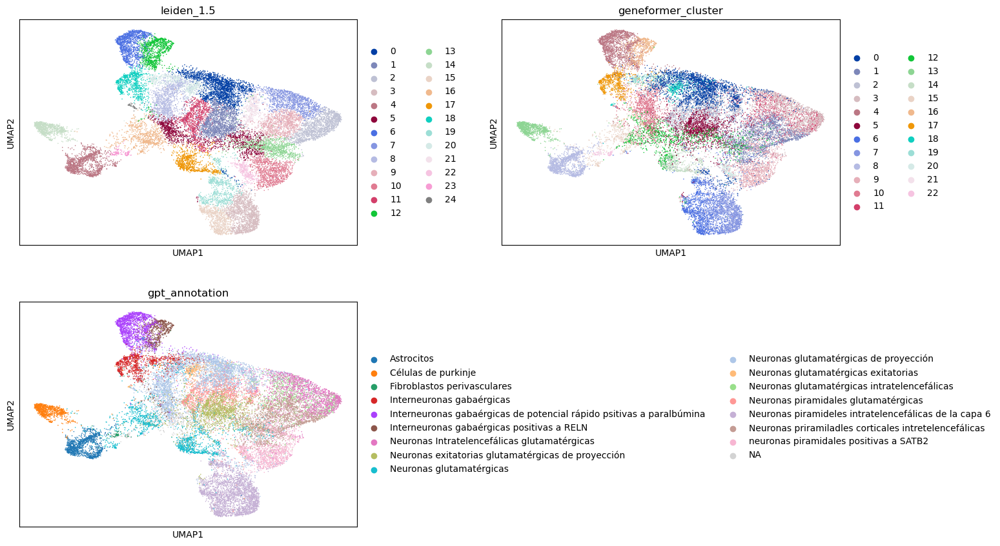

In [26]:
sc.pl.umap(adata, color=['leiden_1.5','geneformer_cluster', 'gpt_annotation'], ncols=2 , wspace=.3)

In [27]:
ann_crosslt = pd.read_csv('../CrosSLT/results/cerebral_cortex_CrosSLT_labels_14.csv', index_col = 0)
ann_crosslt.head()

,leiden_2.5,predicted_annotation
AAACCCAAGAAGCGAA-1-NMR1,5,Unknown
AAACCCAAGGAGGCAG-1-NMR1,20,Vascular
AAACCCACAAATCAAG-1-NMR1,8,Deep-layer near-projecting
AAACCCACAGTCTACA-1-NMR1,0,Unknown
AAACCCAGTACGTAGG-1-NMR1,2,Unknown


In [28]:
adata.obs['CrosSLT_label'] = adata.obs_names.map(ann_crosslt.predicted_annotation.astype("category"))

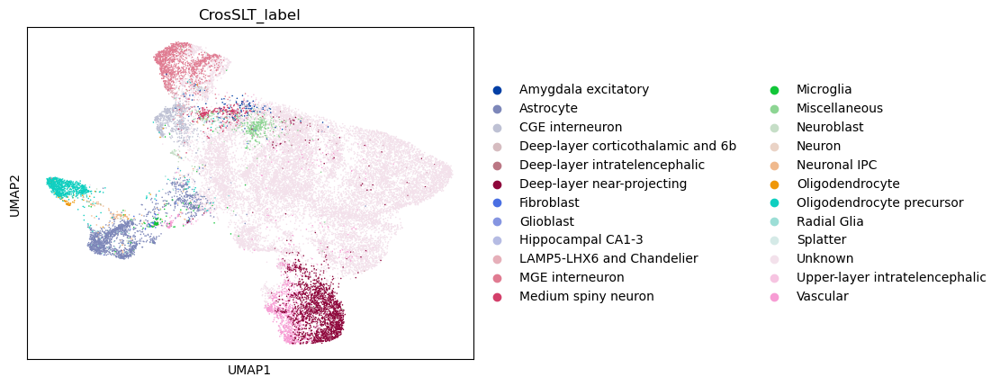

In [29]:
sc.pl.umap(adata, color='CrosSLT_label')

In [32]:
scanvi_ann = pd.read_csv('/home/ratopin/nakedmolerat-scRNAseq/CrosSLT/scanvi_pred.csv', index_col=0)

In [33]:
adata.obs['scanvi_pred'] = adata.obs_names.map(scanvi_ann.Supercluster_pred.astype("category"))

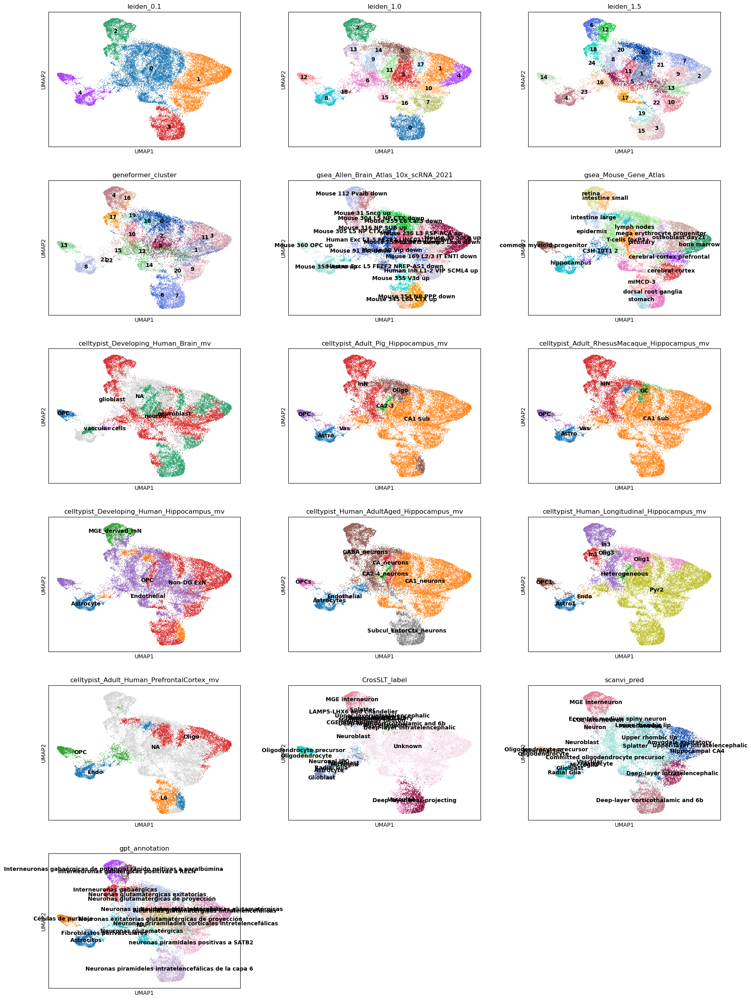

In [37]:
sc.pl.umap(adata, legend_loc='on data',ncols=3,color= ['leiden_0.1', 'leiden_1.0','leiden_1.5', 'geneformer_cluster',
 'gsea_Allen_Brain_Atlas_10x_scRNA_2021',
 'gsea_Mouse_Gene_Atlas',
 'celltypist_Developing_Human_Brain_mv',
 'celltypist_Adult_Pig_Hippocampus_mv',
 'celltypist_Adult_RhesusMacaque_Hippocampus_mv',
 'celltypist_Developing_Human_Hippocampus_mv',
 'celltypist_Human_AdultAged_Hippocampus_mv',
 'celltypist_Human_Longitudinal_Hippocampus_mv',
 'celltypist_Adult_Human_PrefrontalCortex_mv', 
 'CrosSLT_label',
 'scanvi_pred',
 'gpt_annotation'
 ])

## DE

In [38]:
sc.tl.rank_genes_groups(adata, groupby='leiden_1.5', method= 'wilcoxon')


/home/ratopin/miniconda3/envs/scanpy-env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:457: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/ratopin/miniconda3/envs/scanpy-env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:459: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/ratopin/miniconda3/envs/scanpy-env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_grou

In [39]:
sc.tl.filter_rank_genes_groups(adata, min_fold_change= 2, min_in_group_fraction=0.80,
    #max_out_group_fraction=0.5
    )

In [40]:
sc.get.rank_genes_groups_df(adata, group='0').names

0        KCNIP4
1         GRIK2
2         CELF2
3         TAFA1
4         LRP1B
          ...  
17408     KIF1B
17409     KCNQ3
17410       DST
17411     ASAP1
17412    FRMPD4
Name: names, Length: 17413, dtype: object

In [41]:
all_groups_df = sc.get.rank_genes_groups_df(adata, group=None, log2fc_min = 2)
all_groups_df

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,TAFA1,28.179865,2.032712,1.032242e-174,4.493607e-171
1,0,SLC24A4,1.540302,2.042689,1.234868e-01,2.850690e-01
2,0,PLCB2,0.673620,2.169781,5.005528e-01,8.828769e-01
3,0,EBF2,0.397127,2.086364,6.912738e-01,9.996678e-01
4,0,ENSHGLG00000005710,0.180794,2.376514,8.565289e-01,9.996678e-01
...,...,...,...,...,...,...
17541,24,BTG1,0.140959,2.260445,8.879027e-01,9.995984e-01
17542,24,DNAJB11,0.138599,2.043933,8.897669e-01,9.995984e-01
17543,24,PDE3A,0.137180,2.008479,8.908887e-01,9.995984e-01
17544,24,ENSHGLG00000011657,0.131770,2.281938,8.951659e-01,9.995984e-01


In [42]:
# To get the top N genes per cluster in a ranked list format
top_de_genes_per_cluster = {}
for group in adata.obs['leiden_1.5'].cat.categories:
    # Extract the names of the top genes for the current group
    top_genes = adata.uns['rank_genes_groups']['names'][group][:10]
    # Store in a dictionary
    top_de_genes_per_cluster[group] = top_genes.tolist()


In [43]:
pd.DataFrame(top_de_genes_per_cluster)

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,KCNIP4,SLIT3,RORB,TLE4,PTPRZ1,STMN2,NXPH1,CELF2,LHFPL3,PVRL3,...,TLE4,PTPRZ1,SORCS1,ADARB2,TLE4,MEIS2,TSHZ2,LUZP2,LRMDA,EPHA3
1,GRIK2,EPHA6,KCNH7,SOX5,ENSHGLG00000003074,LY6H,ERBB4,CADM2,ADARB2,DGKH,...,KIAA1217,SLC1A3,LDB2,ERBB4,ASIC2,ADARB2,TENM2,PTPRK,COX1,RELN
2,CELF2,EPHA3,ADAMTSL1,DPP10,NPAS3,KLC1,GRIP1,MEF2C,GRID2,RFX3,...,ZFPM2,ENSHGLG00000003074,PEX5L,METAP1D,CDH11,EPHA3,KCNIP4,HS6ST3,F13A1,PLEKHA5
3,TAFA1,NKAIN3,CNTN3,KIAA1217,SLC1A3,ARGLU1,KCNC2,SATB2,GALNTL6,MEF2C,...,DLC1,GPM6B,CDH13,GALNTL6,PDE1A,ERBB4,KCNQ5,UNC5C,MBNL1,GALNTL6
4,LRP1B,NEBL,MEF2C,DLG2,GPM6B,DNM1,GALNTL6,PVRL3,RBMS3,SATB2,...,SOX5,MSI2,LUZP2,UBASH3B,SOX5,PRKG1,RYR3,NKAIN2,FLI1,DACH1
5,ENSHGLG00000012049,TAFA1,RORA,DLC1,CACNA2D3,YTHDC2,GRIA4,TAFA1,SPOCK3,GRM1,...,DOK6,PHLPP1,TOX,GRIK1,DLC1,KCND2,LDB2,KCTD16,ENSHGLG00000003074,CACNA2D1
6,CADM1,TENM1,KCNH5,DOK6,MSI2,GAP43,NRXN3,DGKH,GALNT13,ZNF385B,...,GRIA3,MMD2,ANO3,RBMS3,KIAA1217,PBX3,ARPP21,NTNG2,TTL,UNC13C
7,SCHIP1,AK5,NRG1,PHACTR1,PITPNC1,PRKACB,TCF4,RFX3,CNTNAP2,PTPRD,...,TNIK,ITPR2,TAFA1,NRXN3,KHDRBS2,PIGL,PTPRT,SOX5,LYN,CCSER1
8,CSMD1,ENSHGLG00000008731,FRAS1,ZFPM2,ENSHGLG00000017391,SCN2A,UBASH3B,ADAMTSL1,ENSHGLG00000008731,CPNE8,...,RGS6,SLC1A2,SCHIP1,GRIP1,DOK6,NRG1,CDH20,ENSHGLG00000012049,IGFBP7,UNC5D
9,MACROD2,CSMD1,CPNE8,GRIA3,SLC1A2,ATP9A,RBMS3,NRG1,CSMD3,NWD2,...,DPP10,TSPAN7,BCL11B,NPAS3,LDB2,UNC5D,OPCML,NWD2,AKAP13,ATP8A1


In [44]:
import numpy as np
from scipy import sparse

def top_expressed_genes_per_cluster(adata, cluster_key="cluster", top_n=10, layer=None):

    # Choose matrix
    if layer is not None:
        X = adata.layers[layer]
    else:
        X = adata.X

    # Ensure dense operations behave
    is_sparse = sparse.issparse(X)

    results = {}

    for cluster in adata.obs[cluster_key].unique():

        # Subset cells
        mask = adata.obs[cluster_key] == cluster
        X_cluster = X[mask]

        # Compute mean expression per gene
        if is_sparse:
            mean_expr = np.asarray(X_cluster.mean(axis=0)).ravel()
        else:
            mean_expr = X_cluster.mean(axis=0)

        # Rank genes
        top_indices = np.argsort(mean_expr)[::-1][:top_n]
        top_genes = adata.var_names[top_indices]

        results[cluster] = top_genes.tolist()

    return results


In [45]:
adata

AnnData object with n_obs × n_vars = 24378 × 4000
    obs: 'species', 'sample', 'tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'total_counts_tf', 'log1p_total_counts_tf', 'pct_counts_tf', 'n_counts', 'qc_composite', 'qc_label', 'sample_id', 'replicate', 'leiden', '_scvi_batch', '_scvi_labels', 'gsea_Allen_Brain', 'gsea_Allen_Brain_Atlas_10x_scRNA_2021', 'gsea_Descartes_Cell_Types_and_Tissue_2021', 'gsea_Mouse_Gene_Atlas', 'leiden_0.1', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.5', 'leiden_4.0', 'celltypist_Developing_Human_Brain', 'celltypist_Developing_Human_Brain_mv', 'celltypist_Developing_Mouse_Brain', 'celltypist_Dev

In [46]:
top_expr_per_cluster = top_expressed_genes_per_cluster(adata, 'leiden_1.5', top_n=10, layer = 'scvi_expr')

In [47]:
pd.DataFrame(top_expr_per_cluster)

,5,3,2,18,12,1,17,22,9,13,...,19,15,0,11,10,16,21,14,24,23
0,ENSHGLG00000012049,LRP1B,NRG1,ERBB4,NRXN3,LRP1B,LRP1B,ENSHGLG00000012049,NRG1,NRG1,...,ENSHGLG00000012049,LRP1B,ENSHGLG00000012049,TENM2,ENSHGLG00000012049,ENSHGLG00000012049,TENM2,LHFPL3,RELN,NRG1
1,LRP1B,NRG1,RORA,ADARB2,GRIP1,ENSHGLG00000012049,GRIK2,LRP1B,ENSHGLG00000012049,LRP1B,...,LRP1B,NRG1,LRP1B,ENSHGLG00000012049,LRRTM4,NRG1,ENSHGLG00000012049,ENSHGLG00000012049,PLEKHA5,TTL
2,NRG1,TLE4,LRP1B,NRXN3,GRIK2,GRIK2,TAFA1,HS6ST3,LRRTM4,ENSHGLG00000012049,...,TENM2,SOX5,GRIK2,SCHIP1,KCNQ5,LRP1B,TSHZ2,PTPRZ1,CACNA2D1,ENSHGLG00000012049
3,TENM2,ASIC2,LRRTM4,GALNTL6,NXPH1,TENM2,LRRTM4,LRRTM4,LRP1B,GPC6,...,ASIC2,TLE4,NRG1,LRP1B,LRP1B,TENM2,GRIK2,PCDH15,EPHA3,LRMDA
4,LRRTM4,SOX5,TAFA1,GRIP1,ERBB4,TAFA1,SCHIP1,SCHIP1,SCHIP1,CNTNAP2,...,GRID2,ASIC2,TENM2,GRIK2,NRG1,NPAS3,SCHIP1,NPAS3,GALNTL6,F13A1
5,GRIK2,TENM2,TENM2,GRIK2,CNTNAP2,NRG1,TENM2,GRIK2,ASIC2,LRRTM4,...,SOX5,FRMPD4,CNTNAP2,NRG1,TENM2,GRIK2,KCNQ5,NOVA1,LRRTM4,ENSHGLG00000003074
6,CNTNAP2,ENSHGLG00000012049,KCNH7,METAP1D,ENSHGLG00000012049,EPHA6,NRG1,PTPRK,TAFA1,TENM2,...,GRIK2,KHDRBS3,TAFA1,LRRTM4,NRXN3,NRXN3,ASIC2,ITPR2,UNC5D,CACNA2D3
7,NRXN3,FRMPD4,NEGR1,NPAS3,GALNTL6,NEGR1,NRXN3,KCNQ5,CNTNAP2,TAFA1,...,TLE4,NCAM2,LRRTM4,SLIT3,UNC5C,LRRTM4,NRG1,GPC6,LRP1B,SPTBN1
8,ERBB4,KHDRBS3,SCHIP1,CNTNAP2,NPAS3,GRID2,ENSHGLG00000012049,LUZP2,TENM2,ASIC2,...,NRXN3,ENSHGLG00000012049,SCHIP1,PRKG1,SOX5,ERBB4,LRP1B,NXPH1,NRG1,ARHGAP24
9,GRID2,NCAM2,ADAMTSL1,ENSHGLG00000012049,KCNC2,LRRTM4,CDH13,SOX5,KCNH7,RORA,...,SGCZ,TENM2,GRID2,CADM1,PCSK2,CACNA2D3,CACNA2D3,XYLT1,GRIK2,FRMD4B


In [62]:
multiple_ann = adata.obs[['leiden_0.1', 'leiden_1.0','leiden_1.5', 'geneformer_cluster',
 'gsea_Allen_Brain_Atlas_10x_scRNA_2021',
 'gsea_Mouse_Gene_Atlas',
 'celltypist_Developing_Human_Brain',
 'celltypist_Adult_Pig_Hippocampus',
 'celltypist_Adult_RhesusMacaque_Hippocampus',
 'celltypist_Developing_Human_Hippocampus',
 'celltypist_Human_AdultAged_Hippocampus',
 'celltypist_Human_Longitudinal_Hippocampus',
 'celltypist_Adult_Human_PrefrontalCortex', 
 'CrosSLT_label',
 'scanvi_pred',
 'gpt_annotation'
 ]]

In [63]:
def get_top_n_conditional(series, threshold = 0.8):
    # 1. Get value counts
    counts = series.value_counts()
    if len(counts) < 2:
        return counts.index[0] # Only one category exists
    
    top1_name = counts.index[0]
    top1_count = counts.iloc[0]
    top2_name = counts.index[1]
    top2_count = counts.iloc[1]
    # Check if third class is close
    if len(counts>2):
        top3_name = counts.index[2]
        top3_count = counts.iloc[2]
        if top3_count >= (top1_count * threshold):
            return f"{top1_name} | {top2_name} | {top3_name}"
    # 2. Check if the second is "close"
    if top2_count >= (top1_count * threshold):
        return f"{top1_name} | {top2_name}"
    else:
        return top1_name


In [65]:
mv_annotation = multiple_ann.groupby('leiden_1.5', dropna=False)[['geneformer_cluster',
 'gsea_Allen_Brain_Atlas_10x_scRNA_2021',
 'gsea_Mouse_Gene_Atlas',
 'celltypist_Developing_Human_Brain',
 'celltypist_Adult_Pig_Hippocampus',
 'celltypist_Adult_RhesusMacaque_Hippocampus',
 'celltypist_Developing_Human_Hippocampus',
 'celltypist_Human_AdultAged_Hippocampus',
 'celltypist_Human_Longitudinal_Hippocampus',
 'celltypist_Adult_Human_PrefrontalCortex', 
 'CrosSLT_label',
 'scanvi_pred',
 'gpt_annotation']].agg(get_top_n_conditional)
mv_annotation.head()

,geneformer_cluster,gsea_Allen_Brain_Atlas_10x_scRNA_2021,gsea_Mouse_Gene_Atlas,celltypist_Developing_Human_Brain,celltypist_Adult_Pig_Hippocampus,celltypist_Adult_RhesusMacaque_Hippocampus,celltypist_Developing_Human_Hippocampus,celltypist_Human_AdultAged_Hippocampus,celltypist_Human_Longitudinal_Hippocampus,celltypist_Adult_Human_PrefrontalCortex,CrosSLT_label,scanvi_pred,gpt_annotation
leiden_1.5,,,,,,,,,,,,,
0,0,Mouse 259 L6 Car3 down,lymph nodes,neuron,Oligo,GC | CA1 Sub,OPC,CA1_neurons,Olig1,Oligo | InN,Unknown,Splatter,Neuronas glutamatérgicas de proyección
1,5,Mouse 257 L5 PPP down,pituitary,neuron,CA1 Sub,CA1 Sub,OPC,CA1_neurons,Pyr2,Astro | InN,Unknown,Splatter,Neuronas exitatorias glutamatérgicas de proyec...
2,3,Mouse 35 Sncg up,bone marrow,neuroblast | neuron,CA1 Sub,CA1 Sub,Non-DG ExN,CA1_neurons,Pyr2,Oligo,Unknown,Upper-layer intratelencephalic,Neuronas Intratelencefálicas glutamatérgicas
3,7,Mouse 354 NP PPP down,dorsal root ganglia,neuron | neuroblast,CA1 Sub,CA1 Sub,Non-DG ExN | Endothelial,Subcul_EntorCtx_neurons,Pyr2,L6 | Endo,Deep-layer near-projecting,Deep-layer corticothalamic and 6b,Neuronas piramideles intratelencefálicas de la...
4,8,Mouse 358 Astro up,hippocampus,glioblast | neuroblast,Astro,Astro,Astrocyte,Astrocytes,Astro1,Endo,Astrocyte,Radial Glia,Astrocitos


In [66]:
pd.Series(top_de_genes_per_cluster).astype(str)

0     ['KCNIP4', 'GRIK2', 'CELF2', 'TAFA1', 'LRP1B',...
1     ['SLIT3', 'EPHA6', 'EPHA3', 'NKAIN3', 'NEBL', ...
2     ['RORB', 'KCNH7', 'ADAMTSL1', 'CNTN3', 'MEF2C'...
3     ['TLE4', 'SOX5', 'DPP10', 'KIAA1217', 'DLG2', ...
4     ['PTPRZ1', 'ENSHGLG00000003074', 'NPAS3', 'SLC...
5     ['STMN2', 'LY6H', 'KLC1', 'ARGLU1', 'DNM1', 'Y...
6     ['NXPH1', 'ERBB4', 'GRIP1', 'KCNC2', 'GALNTL6'...
7     ['CELF2', 'CADM2', 'MEF2C', 'SATB2', 'PVRL3', ...
8     ['LHFPL3', 'ADARB2', 'GRID2', 'GALNTL6', 'RBMS...
9     ['PVRL3', 'DGKH', 'RFX3', 'MEF2C', 'SATB2', 'G...
10    ['KCNQ5', 'DLG2', 'SATB2', 'PCSK2', 'SOX5', 'G...
11    ['SLIT3', 'ST6GALNAC5', 'SCHIP1', 'SLIT2', 'SL...
12    ['GRIP1', 'NRXN3', 'NXPH1', 'NETO1', 'KCNC2', ...
13    ['GPC6', 'IL1RAPL2', 'CNTN3', 'LDB2', 'FOXP1',...
14    ['LHFPL3', 'PCDH15', 'PTPRZ1', 'ITPR2', 'SOX6'...
15    ['TLE4', 'KIAA1217', 'ZFPM2', 'DLC1', 'SOX5', ...
16    ['PTPRZ1', 'SLC1A3', 'ENSHGLG00000003074', 'GP...
17    ['SORCS1', 'LDB2', 'PEX5L', 'CDH13', 'LUZP

In [67]:
mv_annotation['top_DEG'] = mv_annotation.index.map(pd.Series(top_de_genes_per_cluster).astype(str))

In [68]:
mv_annotation['top_expr_genes'] = mv_annotation.index.map(pd.Series(top_expr_per_cluster).astype(str))

In [69]:
mv_annotation.head()

,geneformer_cluster,gsea_Allen_Brain_Atlas_10x_scRNA_2021,gsea_Mouse_Gene_Atlas,celltypist_Developing_Human_Brain,celltypist_Adult_Pig_Hippocampus,celltypist_Adult_RhesusMacaque_Hippocampus,celltypist_Developing_Human_Hippocampus,celltypist_Human_AdultAged_Hippocampus,celltypist_Human_Longitudinal_Hippocampus,celltypist_Adult_Human_PrefrontalCortex,CrosSLT_label,scanvi_pred,gpt_annotation,top_DEG,top_expr_genes
leiden_1.5,,,,,,,,,,,,,,,
0,0,Mouse 259 L6 Car3 down,lymph nodes,neuron,Oligo,GC | CA1 Sub,OPC,CA1_neurons,Olig1,Oligo | InN,Unknown,Splatter,Neuronas glutamatérgicas de proyección,"['KCNIP4', 'GRIK2', 'CELF2', 'TAFA1', 'LRP1B',...","['ENSHGLG00000012049', 'LRP1B', 'GRIK2', 'NRG1..."
1,5,Mouse 257 L5 PPP down,pituitary,neuron,CA1 Sub,CA1 Sub,OPC,CA1_neurons,Pyr2,Astro | InN,Unknown,Splatter,Neuronas exitatorias glutamatérgicas de proyec...,"['SLIT3', 'EPHA6', 'EPHA3', 'NKAIN3', 'NEBL', ...","['LRP1B', 'ENSHGLG00000012049', 'GRIK2', 'TENM..."
2,3,Mouse 35 Sncg up,bone marrow,neuroblast | neuron,CA1 Sub,CA1 Sub,Non-DG ExN,CA1_neurons,Pyr2,Oligo,Unknown,Upper-layer intratelencephalic,Neuronas Intratelencefálicas glutamatérgicas,"['RORB', 'KCNH7', 'ADAMTSL1', 'CNTN3', 'MEF2C'...","['NRG1', 'RORA', 'LRP1B', 'LRRTM4', 'TAFA1', '..."
3,7,Mouse 354 NP PPP down,dorsal root ganglia,neuron | neuroblast,CA1 Sub,CA1 Sub,Non-DG ExN | Endothelial,Subcul_EntorCtx_neurons,Pyr2,L6 | Endo,Deep-layer near-projecting,Deep-layer corticothalamic and 6b,Neuronas piramideles intratelencefálicas de la...,"['TLE4', 'SOX5', 'DPP10', 'KIAA1217', 'DLG2', ...","['LRP1B', 'NRG1', 'TLE4', 'ASIC2', 'SOX5', 'TE..."
4,8,Mouse 358 Astro up,hippocampus,glioblast | neuroblast,Astro,Astro,Astrocyte,Astrocytes,Astro1,Endo,Astrocyte,Radial Glia,Astrocitos,"['PTPRZ1', 'ENSHGLG00000003074', 'NPAS3', 'SLC...","['NPAS3', 'ENSHGLG00000012049', 'PTPRZ1', 'CAC..."


In [70]:
mv_annotation.to_excel(f'{region}_combined_annotations_{rev_n}.xlsx')

```
for cluster in adata.obs['leiden_1.5'].unique():
    out_plotname = f'_{cluster}_cluster_preds.png'
    sc.pl.umap(adata[adata.obs['leiden_1.5']==cluster,:], legend_loc='on data',ncols=3,color= ['leiden_0.1', 'leiden_1.5', 'geneformer_cluster',
    'gsea_Allen_Brain_Atlas_10x_scRNA_2021',
    'gsea_Mouse_Gene_Atlas',
    'celltypist_Developing_Human_Brain',
    'celltypist_Adult_Pig_Hippocampus',
    'celltypist_Adult_RhesusMacaque_Hippocampus',
    'celltypist_Developing_Human_Hippocampus',
    'celltypist_Human_AdultAged_Hippocampus',
    'celltypist_Human_Longitudinal_Hippocampus',
    'celltypist_Adult_Human_PrefrontalCortex', 
    'CrosSLT_label',
    'scanvi_pred',
    'gpt_annotation'
    ],
    save = out_plotname)
```

```
for cluster in adata.obs['leiden_1.5'].unique():
    out_plotname = f'_{cluster}_cluster_preds_mv.png'
    sc.pl.umap(adata[adata.obs['leiden_1.5']==cluster,:], legend_loc='on data',ncols=3,color= ['leiden_0.1', 'leiden_1.5', 'geneformer_cluster',
    'gsea_Allen_Brain_Atlas_10x_scRNA_2021',
    'gsea_Mouse_Gene_Atlas',
    'celltypist_Developing_Human_Brain_mv',
    'celltypist_Adult_Pig_Hippocampus_mv',
    'celltypist_Adult_RhesusMacaque_Hippocampus_mv',
    'celltypist_Developing_Human_Hippocampus_mv',
    'celltypist_Human_AdultAged_Hippocampus_mv',
    'celltypist_Human_Longitudinal_Hippocampus_mv',
    'celltypist_Adult_Human_PrefrontalCortex_mv', 
    'CrosSLT_label',
    'scanvi_pred',
    'gpt_annotation'
    ],
    save = out_plotname)

```

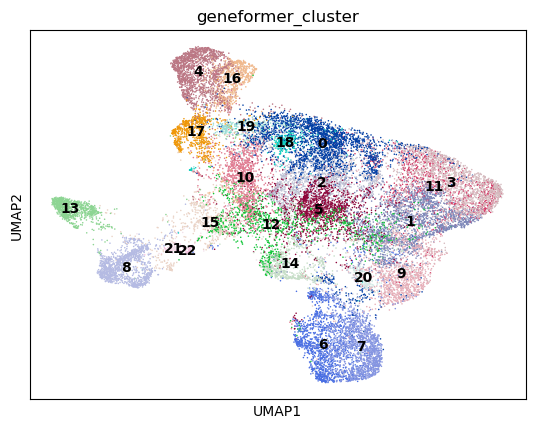

In [81]:
sc.pl.umap(adata, color='geneformer_cluster', legend_loc='on data')

In [56]:
sc.tl.dendrogram(adata, groupby="leiden_1.5", use_rep="X_scvi")


In [57]:
pd.Series(top_de_genes_per_cluster)

0     [KCNIP4, GRIK2, CELF2, TAFA1, LRP1B, ENSHGLG00...
1     [SLIT3, EPHA6, EPHA3, NKAIN3, NEBL, TAFA1, TEN...
2     [RORB, KCNH7, ADAMTSL1, CNTN3, MEF2C, RORA, KC...
3     [TLE4, SOX5, DPP10, KIAA1217, DLG2, DLC1, DOK6...
4     [PTPRZ1, ENSHGLG00000003074, NPAS3, SLC1A3, GP...
5     [STMN2, LY6H, KLC1, ARGLU1, DNM1, YTHDC2, GAP4...
6     [NXPH1, ERBB4, GRIP1, KCNC2, GALNTL6, GRIA4, N...
7     [CELF2, CADM2, MEF2C, SATB2, PVRL3, TAFA1, DGK...
8     [LHFPL3, ADARB2, GRID2, GALNTL6, RBMS3, SPOCK3...
9     [PVRL3, DGKH, RFX3, MEF2C, SATB2, GRM1, ZNF385...
10    [KCNQ5, DLG2, SATB2, PCSK2, SOX5, GRIN2A, KHDR...
11    [SLIT3, ST6GALNAC5, SCHIP1, SLIT2, SLC8A1, NRP...
12    [GRIP1, NRXN3, NXPH1, NETO1, KCNC2, GRIK1, RBM...
13    [GPC6, IL1RAPL2, CNTN3, LDB2, FOXP1, TAFA1, NW...
14    [LHFPL3, PCDH15, PTPRZ1, ITPR2, SOX6, AGAP1, N...
15    [TLE4, KIAA1217, ZFPM2, DLC1, SOX5, DOK6, GRIA...
16    [PTPRZ1, SLC1A3, ENSHGLG00000003074, GPM6B, MS...
17    [SORCS1, LDB2, PEX5L, CDH13, LUZP2, TOX, A

In [58]:
de_genes_for_plot = list(set(
    gene for gene_list in top_de_genes_per_cluster.values() for gene in gene_list[:5]
))

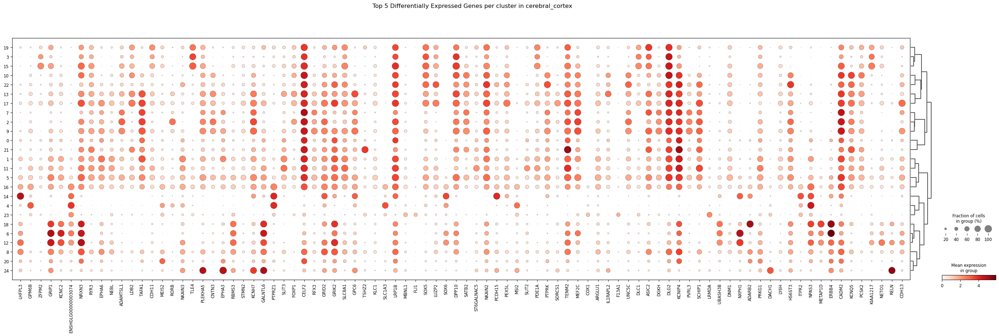

In [83]:
sc.pl.dotplot(
    adata,
    var_names=de_genes_for_plot,
    groupby="leiden_1.5",
    dendrogram=True,
    standard_scale=None,  # or "var" if you want scaling per gene
    cmap="Reds",
    title=f"Top 5 Differentially Expressed Genes per cluster in {region}",
    save = 'top5DEG.png'
)


In [84]:
top_genes_for_plot = list(set(
    gene for gene_list in top_expr_per_cluster.values() for gene in gene_list[:10]
))

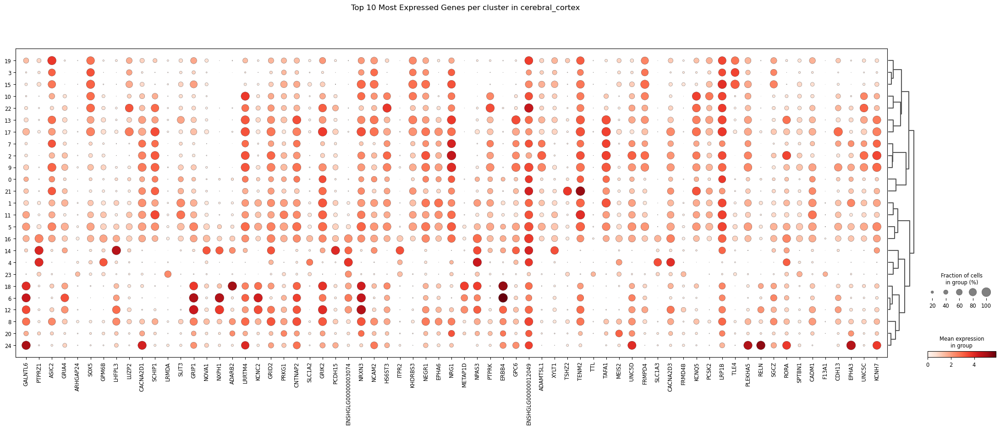

In [85]:
sc.pl.dotplot(
    adata,
    var_names=top_genes_for_plot,
    groupby="leiden_1.5",
    dendrogram=True,
    standard_scale=None,  # or "var" if you want scaling per gene
    cmap="Reds",
    title=f"Top 10 Most Expressed Genes per cluster in {region}", 
    save='top10mostexpressed.png'
)

In [86]:
literature_markers_plus = {'Neural Stem Cell': ['MSI2', 'NOTCH1', 'FUT9', 'SHH', 'MSI1', 'GRIN3A', 'MYO5B'], # SHH, MSI2 -> non-HVG
 'Neuroepithelial Cells': ['NOTCH1','HES1','NES','SOX2', 'SOX10', 'PAX6', 'NCAM2'],
 'Schwann Cell': ['GFAP','GAP43','EOMES','SLC1A2','MBP','NGFR','S100B', 'NCAM1'],
 'Radial Glia': ['SLC1A3','FABP7', 'CDH2', 'CDHR2', 'GFAP',  'NES', 'SOX2', 'TNC', 'VIM','PTN'], #VIM not found
 'Microglia':['LRMDA', 'F13A1', 'ARHGAP24','PTPRC','PYCARD','ASCL1', 'CD40','AIF1','TMEM119', 'CX3CR1','CTSS', 'IRF8', 'IRF5','HCLS1', 'SPI1'],
 'Oligodendrocyte precursor':['ITPR2','DOCK10'],
 'Oligodendrocytes': ['SEMA5A','COLEC12','CD9','GPR17', 'MBP','CNP', 'MAG', 'MOG', 'CSPG4', 'OLIG2', 'PLP1', 'OPALIN', 'OLIG1', 'NKX6-2','SOX10', 'ST18'],
 'Astrocytes': ['SLC1A3','GLI3','GLIS3', 'GFAP','SLC1A2','ALDH1L1', 'SLC1A3','GFAP', 'NOTCH1', 'S100B', 'MEGF10', 'MFGE8','SOX9','AQP4','ALDOC'], 
 'Intermediate Progenitors': ['PAX6','EOMES', 'NEUROG2' ], 
 'Inmature Neurons': ['DCX', 'NEUROD1', 'TBR1', 'TUBB2B', 'TUBB3'], # TUBB3 i dont find it( replaced with Tubb2b)
 'Mature Neurons':['FBN2','ADAMTSL1','RORB','CDH6','HOMER1','SNAP25','RBFOX3', 'NEFH', 'NEFL', 'ENO2', 'THY1', 'UCHL1', 'TUBB3','VIP','SST','PVALB','NEUN', 'TCEAL3'], # TUBB3 i dont find it 
 'Glutamatergic Neurons':['SLC17A6', 'SLC17A7'], 
 'Cholinergic':['CHAT'], 
 'Serotoninergic Neurons':['SLC6A4', 'TPH2'], 
 'Dopaminergic Neurons':['KCNJ6','ALDH1A1', 'LMX1B','TH', 'FOXA2'], 
 'GABAergic Neurons':['GAD1','GAD2','ADORA2A', 'PPP1R1B',  'NPY', 'PENK'],
 'Interneurons':['CALB2','VIP','HTR3A', 'CALB1', 'PVALB', 'SST','GALNTL6','RELN','NXPH1', 'GRIK1', 'GAD2', 'GAD1'],
 'Motor Neurons':['ISL1','OLIG2', 'NEUROG2', 'CHAT'], 
 'Vascular Endothelial': ['VWF', 'CDH5'],
 'Vascular Smooth Muscle': ['ACTA2','MYH11'],
 'Vascular Pericytes': ['KCNJ8'],
 'Arterial Endo': ['GJA4', 'BMX'], 
 'Venous Endo': ['NR2F2'], 
 'Fibroblast': ['PDGFRA','VIM', 'PDGFRB', 'COL1A1', 'COL1A2', 'COL5A1', 'LOXL1', 'FBLN1', 'FBLN2', 'ACTA2'],
 'Mural Cells':['PDGFRB','DES', 'MCAM', 'TAGLN','NOTCH3',  'ANPEP'],
 'Spaltter Neurons': ['FOXP2','SST','CHODL','SLC17A7','SLC32A1', ' PHOX2B',  'LMX1B','NR4A2', 'SLC6A3', 'DDC', 'HMX3','HOX'],
 'Others': ['EYA1', 'FREM1', 'TSHZ2']}
    

In [98]:
def get_top_n_celltypes_per_cluster(count_df: pd.DataFrame, threshold: float = 0.8):
    records = []

    for cluster in count_df.columns:
        votes = count_df[cluster]
        votes = votes[votes > 0].sort_values(ascending=False)

        if len(votes) == 0:
            records.append({
                "cluster": cluster,
                "predicted_celltype": "Unknown"
            })
            continue

        if len(votes) == 1:
            records.append({
                "cluster": cluster,
                "predicted_celltype": votes.index[0]
            })
            continue

        top1_name = votes.index[0]
        top1_count = votes.iloc[0]

        result_names = [top1_name]

        # Check second
        top2_name = votes.index[1]
        top2_count = votes.iloc[1]

        if top2_count >= (top1_count * threshold):
            result_names.append(top2_name)

            # Check third only if second passed
            if len(votes) > 2:
                top3_name = votes.index[2]
                top3_count = votes.iloc[2]

                if top3_count >= (top1_count * threshold):
                    result_names.append(top3_name)

        records.append({
            "cluster": cluster,
            "predicted_celltype": " | ".join(result_names)
        })

    return pd.DataFrame(records)


In [87]:
filtered_markers_plus = {}
for key, markers in literature_markers_plus.items():
    found_genes = [gene for gene in markers if gene in adata.var_names]
    if len(found_genes)>0:
        filtered_markers_plus[key] = [gene for gene in markers if gene in adata.var_names]
filtered_markers_plus

{'Neural Stem Cell': ['MSI2',
  'NOTCH1',
  'FUT9',
  'SHH',
  'MSI1',
  'GRIN3A',
  'MYO5B'],
 'Neuroepithelial Cells': ['NOTCH1', 'HES1', 'NES', 'PAX6', 'NCAM2'],
 'Schwann Cell': ['GFAP', 'GAP43', 'EOMES', 'SLC1A2', 'MBP'],
 'Radial Glia': ['SLC1A3', 'FABP7', 'CDH2', 'GFAP', 'NES', 'TNC', 'PTN'],
 'Microglia': ['LRMDA',
  'F13A1',
  'ARHGAP24',
  'PTPRC',
  'ASCL1',
  'AIF1',
  'CX3CR1',
  'IRF8',
  'HCLS1',
  'SPI1'],
 'Oligodendrocyte precursor': ['ITPR2', 'DOCK10'],
 'Oligodendrocytes': ['SEMA5A',
  'COLEC12',
  'CD9',
  'GPR17',
  'MBP',
  'MAG',
  'MOG',
  'PLP1',
  'NKX6-2',
  'ST18'],
 'Astrocytes': ['SLC1A3',
  'GLI3',
  'GLIS3',
  'GFAP',
  'SLC1A2',
  'ALDH1L1',
  'SLC1A3',
  'GFAP',
  'NOTCH1',
  'MEGF10',
  'MFGE8',
  'SOX9',
  'AQP4',
  'ALDOC'],
 'Intermediate Progenitors': ['PAX6', 'EOMES'],
 'Inmature Neurons': ['TUBB2B'],
 'Mature Neurons': ['FBN2',
  'ADAMTSL1',
  'RORB',
  'CDH6',
  'HOMER1',
  'SNAP25',
  'NEFL',
  'ENO2',
  'UCHL1',
  'VIP',
  'SST',
  'TCEAL3']

categories: 0, 1, 2, etc.
var_group_labels: Neural Stem Cell, Neuroepithelial Cells, Schwann Cell, etc.


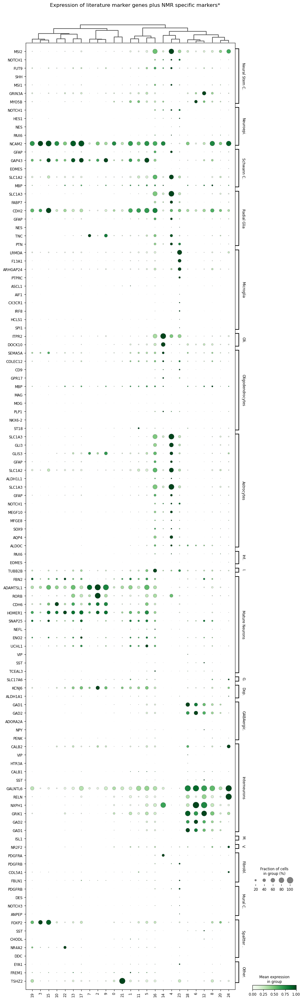

In [115]:
sc.pl.dotplot(
    adata=adata,
    var_names=filtered_markers_plus,
    groupby='leiden_1.5',
    dendrogram=True,
    color_map="Greens",
    swap_axes=True,
    use_raw=False,
    standard_scale="var",
    title='Expression of literature marker genes plus NMR specific markers*',
    save=f'{region}_v{rev_n}_known_markers_plus.png'
)

In [99]:
overlap2 = sc.tl.marker_gene_overlap(adata, literature_markers_plus, key='rank_genes_groups')
overlap2.head()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
Neural Stem Cell,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
Neuroepithelial Cells,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
Schwann Cell,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
Radial Glia,0.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,...,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
Microglia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0


In [106]:
literature_marker_pred = get_top_n_celltypes_per_cluster(count_df =overlap2, threshold = 0.9).set_index('cluster').astype('category')
literature_marker_pred.head()

,predicted_celltype
cluster,
0,Interneurons
1,Unknown
2,Mature Neurons
3,Spaltter Neurons
4,Astrocytes


In [107]:
literature_marker_pred.to_csv("known_literature predictions.csv")

In [108]:
adata.obs['known_gene_overlap_pred'] = adata.obs['leiden_1.5'].map(literature_marker_pred.predicted_celltype)

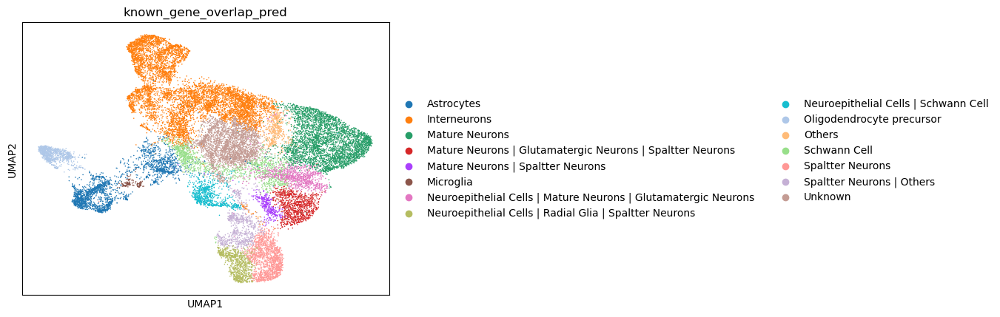

In [113]:
sc.pl.umap(adata, color='known_gene_overlap_pred',
           #legend_loc='on data',
           save='_known_markers_overlap_pred.png')

In [120]:
out_name = f'/home/ratopin/big_data/nmr/{region}_nmr_adata_multiple_final_ann{rev_n}.h5ad'
adata.write_h5ad(out_name)

TypeError: Can't implicitly convert non-string objects to strings